# Rendering a Single Recent True-Color Image

In [6]:
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
from datetime import date
import datetime
import os

Lets start by querying for all available products covering Berlin between 22 May 2020 and 22 June 2020.

In [7]:
start_date = date(2020, 5, 22)
end_date = date(2020, 6, 22)
location = 'POINT (13.389 52.517)' # note that this is in the order longitude, latitude (or x, y)

The API is set up using environment variables. We pass in the username and password for the account created in order to [gain access to the Copernicus Open Access Hub](scihub.copernicus.eu/dhus/):

In [8]:
api = SentinelAPI(os.getenv('SCIHUB_USERNAME'), os.getenv('SCIHUB_PASSWORD'))

We also make sure that we see enough by defining `cloudcoverpercentage` to be at most 30%.

In [9]:
products = api.query(location,
                     platformname='Sentinel-2',
                     processinglevel='Level-2A',
                     date=(start_date, end_date),
                     cloudcoverpercentage=(0,30))

How many results do we have?

In [10]:
print('Found ' + str(len(products)) + ' results')

Found 8 results


`products` is a map of product UUID to detailed meta information for each product. This meta information contains scene classification image and more, all if which we can use to further narrow down the products as needed.

In [12]:
products[list(products.keys())[0]]

{'title': 'S2A_MSIL2A_20200617T101031_N0214_R022_T32UQD_20200617T161854',
 'link': "https://scihub.copernicus.eu/apihub/odata/v1/Products('d692a650-1806-4e9b-88d1-e824f976c3ea')/$value",
 'link_alternative': "https://scihub.copernicus.eu/apihub/odata/v1/Products('d692a650-1806-4e9b-88d1-e824f976c3ea')/",
 'link_icon': "https://scihub.copernicus.eu/apihub/odata/v1/Products('d692a650-1806-4e9b-88d1-e824f976c3ea')/Products('Quicklook')/$value",
 'summary': 'Date: 2020-06-17T10:10:31.024Z, Instrument: MSI, Satellite: Sentinel-2, Size: 767.32 MB',
 'ondemand': 'false',
 'beginposition': datetime.datetime(2020, 6, 17, 10, 10, 31, 24000),
 'endposition': datetime.datetime(2020, 6, 17, 10, 10, 31, 24000),
 'ingestiondate': datetime.datetime(2020, 6, 17, 21, 36, 5, 667000),
 'orbitnumber': 26045,
 'relativeorbitnumber': 22,
 'vegetationpercentage': 53.789741,
 'notvegetatedpercentage': 10.124303,
 'waterpercentage': 1.598228,
 'unclassifiedpercentage': 2.743873,
 'mediumprobacloudspercentage': 

Because Berlin is located at the overlapping part of two UTM zones (T32UQD and T33UUU) we get a lot of duplicate data. For every product we get one version covering T32UQD and one version covering T33UUU (for more detail on how to extract this information from a product's name see the [user guide on naming convention](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi/naming-convention)):

In [19]:
[v['title'] for v in products.values()]

['S2A_MSIL2A_20200617T101031_N0214_R022_T32UQD_20200617T161854',
 'S2A_MSIL2A_20200617T101031_N0214_R022_T33UUU_20200617T161854',
 'S2B_MSIL2A_20200615T101559_N0214_R065_T33UUU_20200615T141117',
 'S2B_MSIL2A_20200615T101559_N0214_R065_T32UQD_20200615T141117',
 'S2B_MSIL2A_20200602T100559_N0214_R022_T32UQD_20200602T135324',
 'S2B_MSIL2A_20200602T100559_N0214_R022_T33UUU_20200602T135324',
 'S2A_MSIL2A_20200531T102031_N0214_R065_T33UUU_20200531T134031',
 'S2A_MSIL2A_20200531T102031_N0214_R065_T32UQD_20200531T134031']

We therefore drop half of the products by deciding on a single UTM zone.

In [24]:
subset = {uuid: product for uuid, product in products.items() if '_T33UUU_' in product['title']}
len(subset)

4

We continue by creating the folder structure and initializing the download.

In [26]:
from pathlib import Path

dst_path = Path('input/raster/berlin_true_color')

In [27]:
! mkdir -p {dst_path}

In [39]:
downloads = api.download_all(subset, dst_path)

The `sentinelsat` client is smart enough to figure out which files were already downloaded so repeated calls to `download_all` avoid unnecessary time spent on duplicate downloads. Let's get an overview of what the downloaded files look like:

In [29]:
! ls -sh {dst_path / '*.zip'}

1.1G input/raster/berlin_true_color/S2A_MSIL2A_20200531T102031_N0214_R065_T33UUU_20200531T134031.zip
815M input/raster/berlin_true_color/S2A_MSIL2A_20200617T101031_N0214_R022_T33UUU_20200617T161854.zip
823M input/raster/berlin_true_color/S2B_MSIL2A_20200602T100559_N0214_R022_T33UUU_20200602T135324.zip
1.1G input/raster/berlin_true_color/S2B_MSIL2A_20200615T101559_N0214_R065_T33UUU_20200615T141117.zip


We downloaded 4 zip files with a size of roughly 4GB.

## Previewing Downloaded Files

In [74]:
import rasterio as r
from rasterio import plot

import matplotlib.pyplot as plt
%matplotlib inline

In [46]:
downloaded = list(downloads[0].values())
Path(downloaded[0]['path']).name

'S2B_MSIL2A_20200615T101559_N0214_R065_T33UUU_20200615T141117.zip'

In [61]:
import zipfile

def band_paths(p, bands, resolution=None):
    '''
    Given a zip file at `p`, returns the paths inside p to the raster files containing
    information for the given bands. Because some bands are available in more than one
    resolution, this can be filtered by prodiding a third parameter (e.g. resolution='10m').
    
    The returned paths are formatted in the zip scheme as per Apache Commons VFS and can
    thus be directly opened by rasterio.
    '''
    with zipfile.ZipFile(p) as f:
        files = f.namelist()
        rasters = [f for f in files if f.endswith('.jp2')]
        rasters = ['zip+file://' + p + '!/' + r for b in bands for r in rasters if b in r and (not resolution or resolution in r)]
        return rasters

In [48]:
def rgb_paths(zip_file, resolution='10m'):
    return band_paths(zip_file, ['B02', 'B03', 'B04'], resolution)

In [55]:
# plotting the combined rgb image
true_color = r.open(band_paths(downloaded[0]['path'], ['TCI'], '20m')[0])

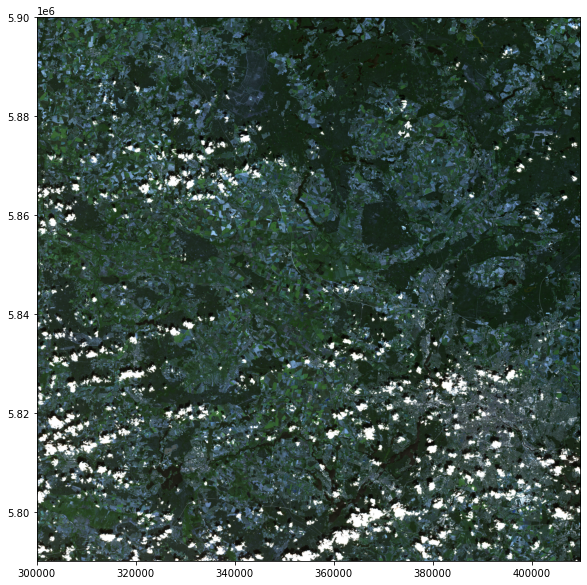

In [56]:
# note that in order to get the real colors, we need to reverse the bands into "rasterio band order"
fig, (ax) = plt.subplots(1, 1, figsize=(10,10))
plot.show(true_color.read()[::-1], transform=true_color.transform, ax=ax)
plt.show()

## Creating Your Own Composite Image

In [70]:
import numpy as np

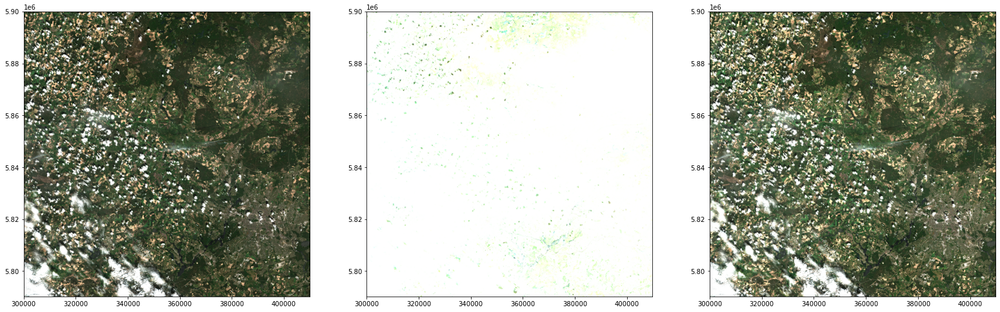

In [80]:
b02, b03, b04, true_color = band_paths(downloaded[3]['path'], ['B02', 'B03', 'B04', 'TCI'], '20m')

def normalize_range(v):
    return np.clip(v, 0, 2000) / 2000

with r.open(b02) as blue, r.open(b03) as green, r.open(b04) as red, r.open(true_color) as tci:
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(27,9))
    
    plot.show(tci, transform=blue.transform, ax=ax1)
    plot.show([red.read(1), green.read(1), blue.read(1)],
              transform=blue.transform, ax=ax2)
    plot.show([normalize_range(red.read(1)),
               normalize_range(green.read(1)),
               normalize_range(blue.read(1))],
              transform=blue.transform, ax=ax3)
    
    plt.show()
    fig.savefig('berlin_true_color_image_naive_plot.png', dpi=300)

In [20]:
# note that the BGR images have a different range.
blue = r.open(b02).read(1)

In [21]:
np.min(blue), np.max(blue)

(0, 18832)

In [22]:
green = r.open(b03).read(1)
red = r.open(b04).read(1)

np.min(green), np.max(green)

(0, 17633)

In [23]:
np.min(red), np.max(red)

(0, 16837)

In [24]:
np.nanpercentile(blue, (0,95))

array([   0., 2301.])

We can find some information about how the TCI images are created [here](https://sentinel.esa.int/web/sentinel/user-guides/sentinel-2-msi/definitions). Particularly interesting is the following quote:

>  The TCI is an RGB image built from the B02 (Blue), B03 (Green), and B04 (Red) Bands. The reflectances are coded between 1 and 255, 0 being reserved for 'No Data'. The saturation level of 255 digital counts correspond to a level of 3558 for L1C products or 2000 for L2A products (0.3558 and 0.2 in reflectance value respectively.

In [25]:
red_cleaned = np.where(red <= 2000, red, np.nan) / 2000
green_cleaned = np.where(green <= 2000, green, np.nan) / 2000
blue_cleaned = np.where(blue <= 2000, blue, np.nan) / 2000

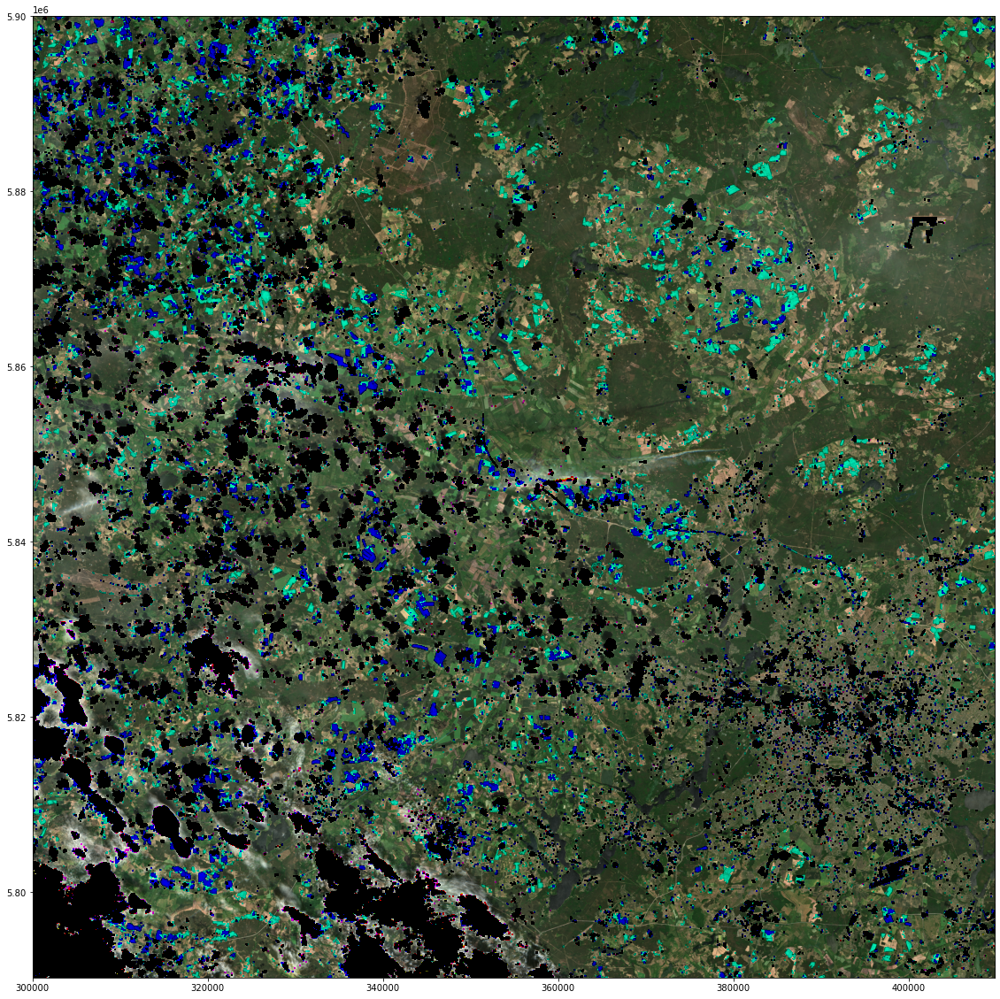

In [26]:
transform = r.open(b02).transform
plt.figure(figsize=(20,20))
plot.show([red_cleaned, green_cleaned, blue_cleaned], transform=transform)

A-ha! The out of range values appear to be clouds.

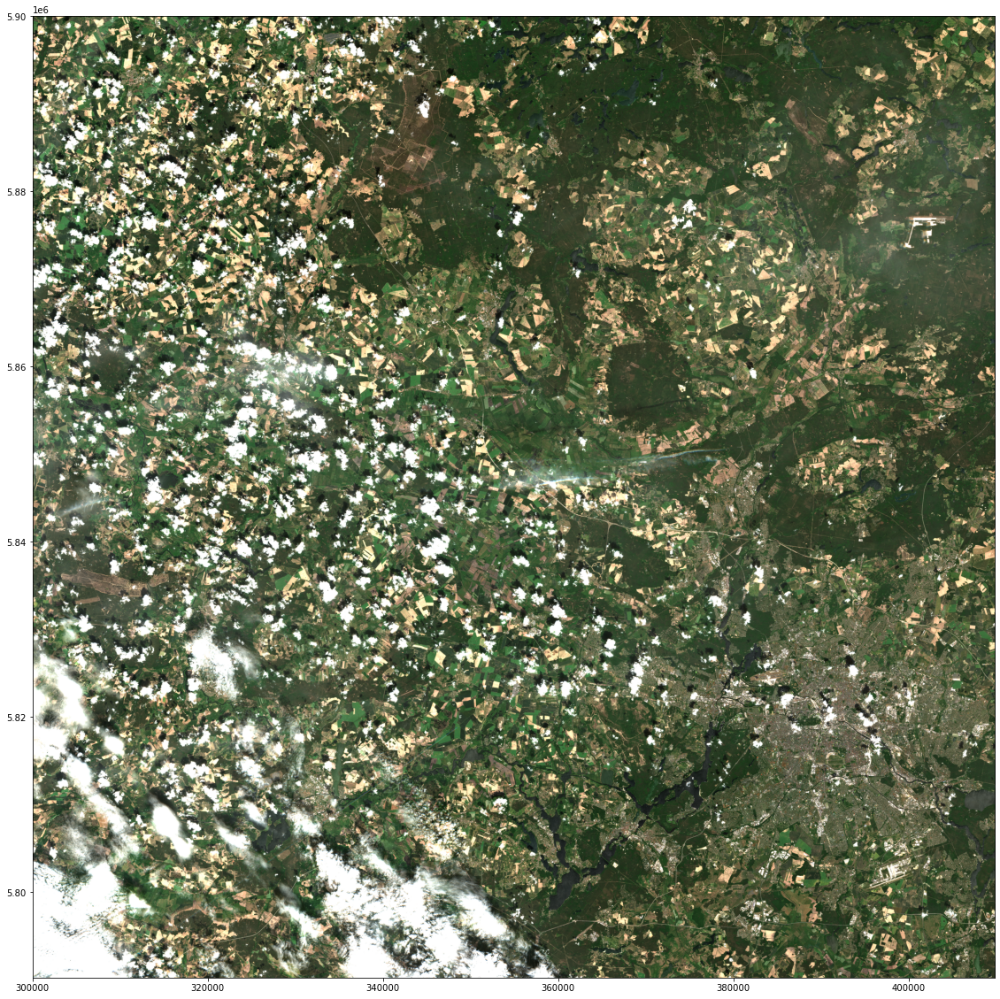

In [27]:
plt.figure(figsize=(20,20))
plot.show([np.clip(red, 0, 2000) / 2000, np.clip(green, 0, 2000) / 2000, np.clip(blue, 0, 2000) / 2000], transform=transform)